In [1]:
import sys
import numpy as np
import numpy.matlib
import math
import matplotlib.pyplot as plt
from skimage.io import imread
import scipy.io as sio
np.set_printoptions(threshold=sys.maxsize)
%matplotlib inline
plt.rcParams['figure.figsize'] = (15.0, 12.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'

# for auto-reloading extenrnal modules
%load_ext autoreload
%autoreload 2

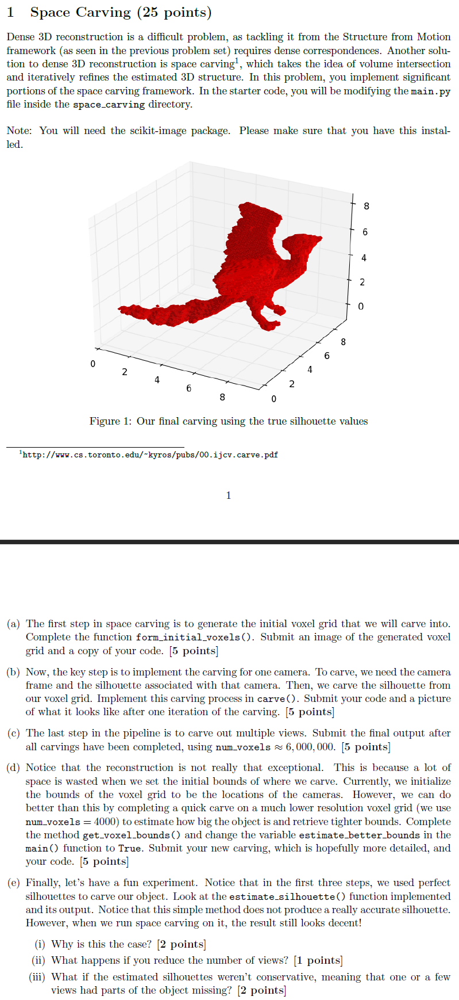

In [2]:
import argparse
from space_carving.camera import Camera
from space_carving.plotting import *

In [3]:
# A very simple, but useful method to take the difference between the
# first and second element (usually for 2D vectors)
def diff(x):
    return x[1] - x[0]

In [4]:
#(A)
def form_initial_voxels(xlim, ylim, zlim, num_voxels):
    '''
    FORM_INITIAL_VOXELS  create a basic grid of voxels ready for carving

    Arguments:
        xlim - The limits of the x dimension given as [xmin xmax]

        ylim - The limits of the y dimension given as [ymin ymax]

        zlim - The limits of the z dimension given as [zmin zmax]

        num_voxels - The approximate number of voxels we desire in our grid

    Returns:
        voxels - An ndarray of size (N, 3) where N is approximately equal the 
            num_voxels of voxel locations.

        voxel_size - The distance between the locations of adjacent voxels
            (a voxel is a cube)

    Our initial voxels will create a rectangular prism defined by the x,y,z
    limits. Each voxel will be a cube, so you'll have to compute the
    approximate side-length (voxel_size) of these cubes, as well as how many
    cubes you need to place in each dimension to get around the desired
    number of voxel. This can be accomplished by first finding the total volume of
    the voxel grid and dividing by the number of desired voxels. This will give an
    approximate volume for each cubic voxel, which you can then use to find the 
    side-length. The final "voxels" output should be a ndarray where every row is
    the location of a voxel in 3D space.
    '''
    # TODO: Implement this method!
    #from https://github.com/chizhang529/cs231a/blob/master/Homework/PS3/ps3/space_carving/main.py
    x_range = xlim[1] - xlim[0]
    y_range = ylim[1] - ylim[0]
    z_range = zlim[1] - zlim[0]
    
    voxel_size = np.cbrt(x_range * y_range * z_range /num_voxels)
    n_x, n_y, n_z = int(x_range / voxel_size), int(y_range / voxel_size), int(z_range / voxel_size)
    voxels = np.ones((n_x * n_y * n_z, 3), dtype=np.float64) * np.array([[xlim[0], ylim[0], zlim[0]]])
    x, y, z = np.arange(n_x), np.arange(n_y), np.arange(n_z)
    x1 = np.tile(x, n_y * n_z).reshape(-1, 1)
    y1 = np.tile(np.repeat(y, n_x), n_z).reshape(-1, 1)
    z1 = np.repeat(z, n_x * n_y).reshape(-1, 1)
    voxels += np.c_[x1, y1, z1] * voxel_size
    return voxels, voxel_size

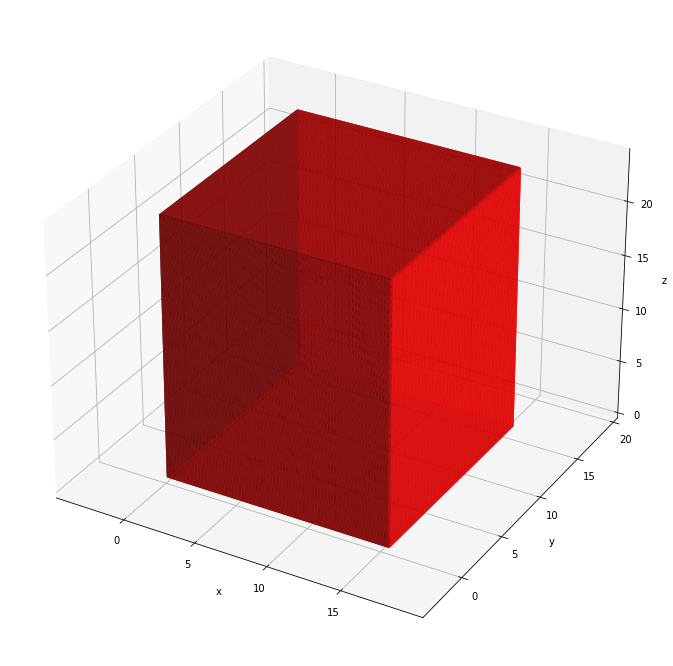

In [5]:
frames = sio.loadmat('space_carving/frames.mat')['frames'][0]
cameras = [Camera(x) for x in frames]
camera_positions = np.vstack([c.T for c in cameras])
xlim = [camera_positions[:,0].min(), camera_positions[:,0].max()]
ylim = [camera_positions[:,1].min(), camera_positions[:,1].max()]
zlim = [camera_positions[:,2].min(), camera_positions[:,2].max()]
camera_range = 0.6 * np.sqrt(diff( xlim )**2 + diff( ylim )**2)
for c in cameras:
    viewpoint = c.T - camera_range * c.get_camera_direction()
    zlim[0] = min( zlim[0], viewpoint[2] )
    zlim[1] = max( zlim[1], viewpoint[2] )

# Move the limits in a bit since the object must be inside the circle
xlim = xlim + diff(xlim) / 4 * np.array([1, -1])
ylim = ylim + diff(ylim) / 4 * np.array([1, -1])
voxels, voxel_size = form_initial_voxels(xlim, ylim, zlim, 6e6)
plot_surface(voxels)

In [6]:
cameras[0].__dict__.keys(), cameras[0].image.shape

(dict_keys(['image', 'P', 'K', 'R', 'T', 'silhouette']), (768, 1024, 3))

In [7]:
#(B)
def carve(voxels, camera):
    '''
    CARVE: carves away voxels that are not inside the silhouette contained in 
        the view of the camera. The resulting voxel array is returned.

    Arguments:
        voxels - an Nx3 matrix where each row is the location of a cubic voxel

        camera - The camera we are using to carve the voxels with. Useful data
            stored in here are the "silhouette" matrix, "image", and the
            projection matrix "P". 

    Returns:
        voxels - a subset of the argument passed that are inside the silhouette
    '''
    # TODO: Implement this method!
    sil = camera.silhouette
    idx = np.nonzero(sil)
    P = camera.P
    x_min, x_max = np.min(idx[1]), np.max(idx[1])
    y_min, y_max = np.min(idx[0]), np.max(idx[0])
    # map 3d point to 2d point
    one = np.ones((voxels.shape[0], 1))
    point_3d = np.c_[voxels, one]
    point_2d = P.dot(point_3d.T).T
    point_2d /= point_2d[:, 2].reshape(-1,1)
    point_2d = point_2d[:, :2].astype(int)
    mask = (point_2d[:, 0] >= x_min) & (point_2d[:, 0] <= x_max) & (point_2d[:, 1] >= y_min) & (point_2d[:, 1] <= y_max)
    subidx = np.argwhere(mask == True).flatten()
    subpoint = point_2d[subidx, :]
    # validate if every subpoint is in the silhouette
    subidx = subidx[sil[subpoint[:, 1], subpoint[:, 0]] == True]
    return voxels[subidx, :]

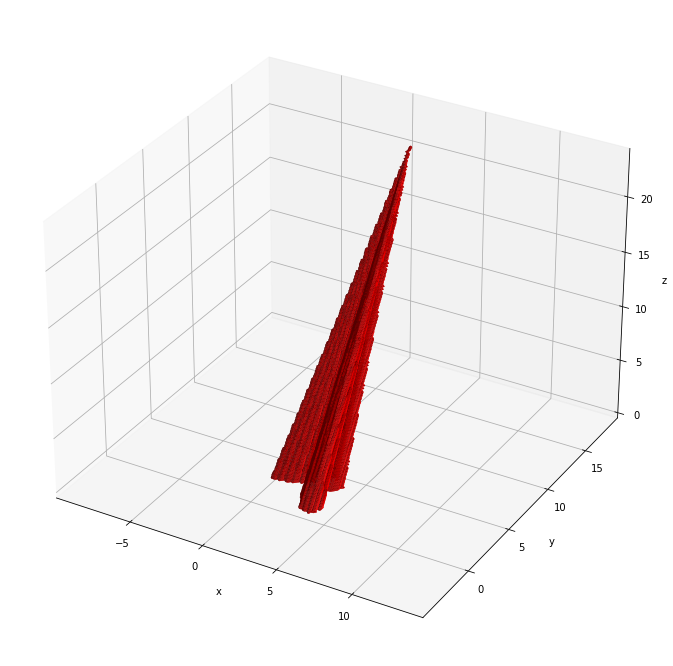

In [8]:
voxels = carve(voxels, cameras[0])
plot_surface(voxels)

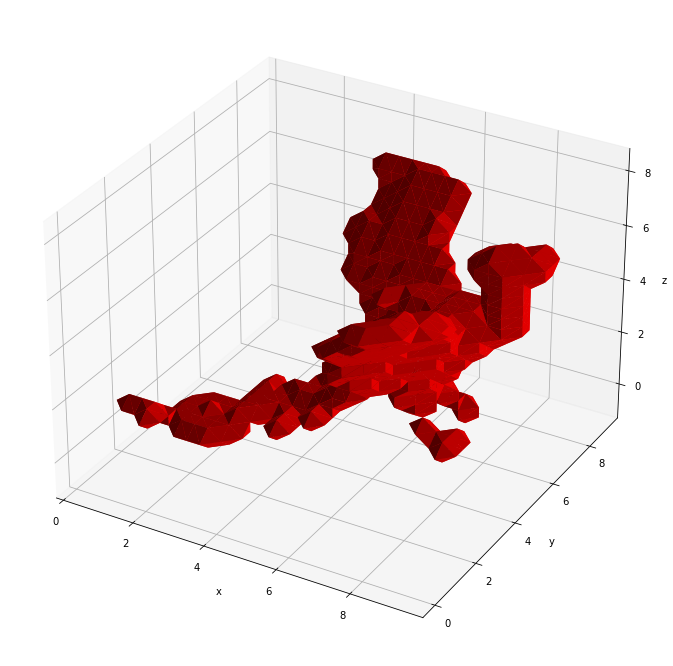

In [9]:
for c in cameras:
    voxels = carve(voxels, c)  
plot_surface(voxels, voxel_size)

In [10]:
#(D)
def get_voxel_bounds(cameras, estimate_better_bounds = False, num_voxels = 4000):
    '''
    GET_VOXEL_BOUNDS: Gives a nice bounding box in which the object will be carved
    from. We feed these x/y/z limits into the construction of the inital voxel
    cuboid. 

    Arguments:
        cameras - The given data, which stores all the information
            associated with each camera (P, image, silhouettes, etc.)

        estimate_better_bounds - a flag that simply tells us whether to set tighter
            bounds. We can carve based on the silhouette we use.

        num_voxels - If estimating a better bound, the number of voxels needed for
            a quick carving.

    Returns:
        xlim - The limits of the x dimension given as [xmin xmax]

        ylim - The limits of the y dimension given as [ymin ymax]

        zlim - The limits of the z dimension given as [zmin zmax]

    The current method is to simply use the camera locations as the bounds. In the
    section underneath the TODO, please implement a method to find tigther bounds:
    One such approach would be to do a quick carving of the object on a grid with 
    very few voxels. From this coarse carving, we can determine tighter bounds. Of
    course, these bounds may be too strict, so we should have a buffer of one 
    voxel_size around the carved object. 
    '''
    camera_positions = np.vstack([c.T for c in cameras])
    xlim = [camera_positions[:,0].min(), camera_positions[:,0].max()]
    ylim = [camera_positions[:,1].min(), camera_positions[:,1].max()]
    zlim = [camera_positions[:,2].min(), camera_positions[:,2].max()]

    # For the zlim we need to see where each camera is looking. 
    camera_range = 0.6 * np.sqrt(diff( xlim )**2 + diff( ylim )**2)
    for c in cameras:
        viewpoint = c.T - camera_range * c.get_camera_direction()
        zlim[0] = min( zlim[0], viewpoint[2] )
        zlim[1] = max( zlim[1], viewpoint[2] )

    # Move the limits in a bit since the object must be inside the circle
    xlim = xlim + diff(xlim) / 4 * np.array([1, -1])
    ylim = ylim + diff(ylim) / 4 * np.array([1, -1])

    if estimate_better_bounds:
        # TODO: Implement this method!
        voxels, voxel_size = form_initial_voxels(xlim, ylim, zlim, num_voxels)
        for c in cameras:
            voxels = carve(voxels, c)
        low = np.min(voxels, axis=0) - voxel_size
        high = np.max(voxels, axis=0) + voxel_size
        xlim[0], ylim[0], zlim[0] = low[0], low[1], low[2]
        xlim[1], ylim[1], zlim[1] = high[0], high[1], high[2]
    return xlim, ylim, zlim

In [11]:
def estimate_silhouette(im):
    '''
    ESTIMATE_SILHOUETTE: Uses a very naive and color-specific heuristic to generate
    the silhouette of an object

    Arguments:
        im - The image containing a known object. An ndarray of size (H, W, C).

    Returns:
        silhouette - An ndarray of size (H, W), where each pixel location is 0 or 1.
            If the (i,j) value is 0, then that pixel location in the original image 
            does not correspond to the object. If the (i,j) value is 1, then that
            that pixel location in the original image does correspond to the object.
    '''
    return np.logical_and(im[:,:,0] > im[:,:,2], im[:,:,0] > im[:,:,1] )

In [12]:
estimate_better_bounds = True
use_true_silhouette = True
frames = sio.loadmat('space_carving/frames.mat')['frames'][0]
cameras = [Camera(x) for x in frames]

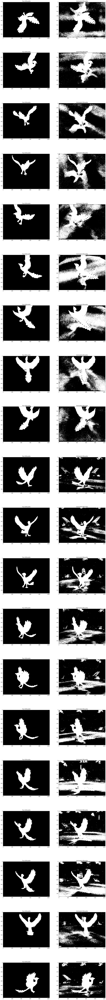

In [13]:
# Generate the silhouettes based on a color heuristic
cameras = [Camera(x) for x in frames]
totalRows = len(cameras)
plt.figure(figsize=(20,200))
for i, c in enumerate(cameras):
    c.true_silhouette = c.silhouette
    c.silhouette = estimate_silhouette(c.image)
    
    plt.subplot2grid((totalRows,2), (i,0))
    plt.imshow(c.true_silhouette, cmap = 'gray')
    plt.title('True Silhouette')
#     plt.subplots_adjust(wspace = .001, hspace = .001)    
    
    plt.subplot2grid((totalRows,2), (i,1))
    plt.imshow(c.silhouette, cmap = 'gray')
    plt.title('Estimated Silhouette')
#     plt.subplots_adjust(wspace = .001, hspace = .001)    

plt.show()

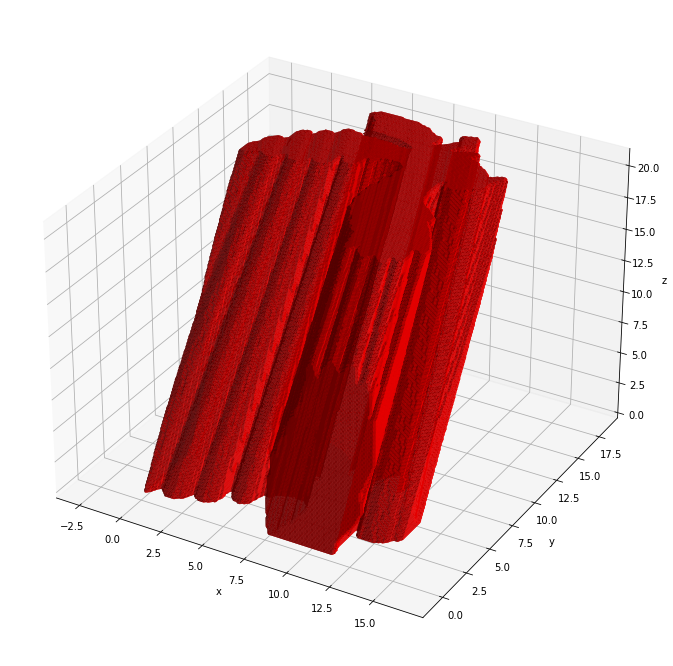

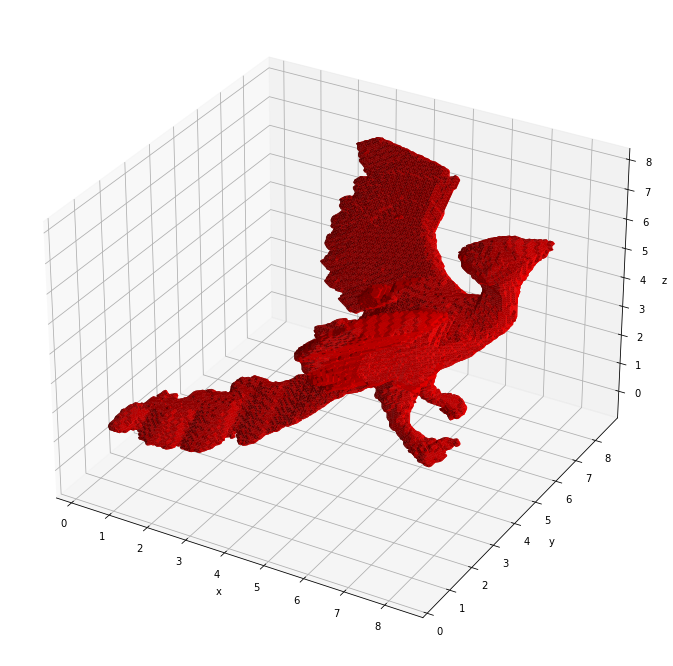

In [14]:
estimate_better_bounds = True
use_true_silhouette = True
frames = sio.loadmat('./space_carving/frames.mat')['frames'][0]
cameras = [Camera(x) for x in frames]
if not use_true_silhouette:
    for i, c in enumerate(cameras):
        c.true_silhouette = c.silhouette
        c.silhouette = estimate_silhouette(c.image)
        if i == 0:
            plt.figure()
            plt.subplot(121)
            plt.imshow(c.true_silhouette, cmap = 'gray')
            plt.title('True Silhouette')
            plt.subplot(122)
            plt.imshow(c.silhouette, cmap = 'gray')
            plt.title('Estimated Silhouette')
            plt.show()

# Generate the voxel grid
# You can reduce the number of voxels for faster debugging, but
# make sure you use the full amount for your final solution
num_voxels = 6e6
xlim, ylim, zlim = get_voxel_bounds(cameras, estimate_better_bounds)

# This part is simply to test forming the initial voxel grid
# voxels, voxel_size = form_initial_voxels(xlim, ylim, zlim, 4000)
# plot_surface(voxels)
voxels, voxel_size = form_initial_voxels(xlim, ylim, zlim, num_voxels)

# Test the initial carving
voxels = carve(voxels, cameras[0])
if use_true_silhouette:
    plot_surface(voxels)
# Result after all carvings
for c in cameras:
    voxels = carve(voxels, c)
plot_surface(voxels, voxel_size)

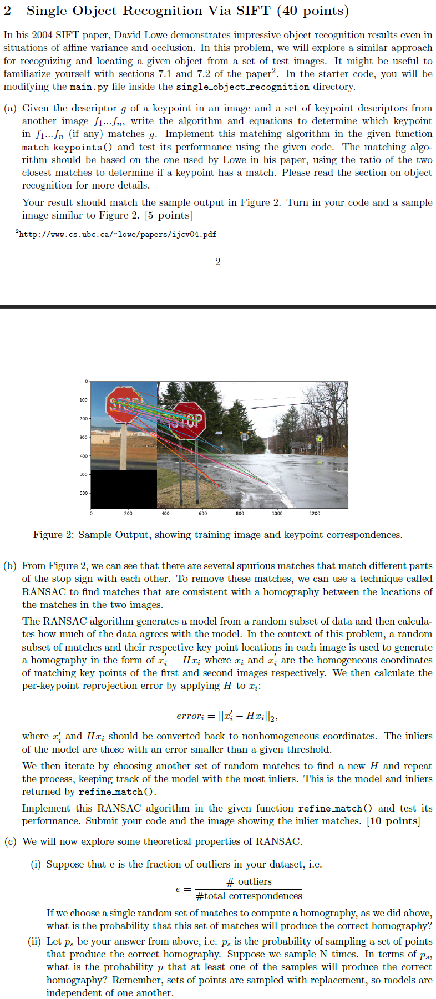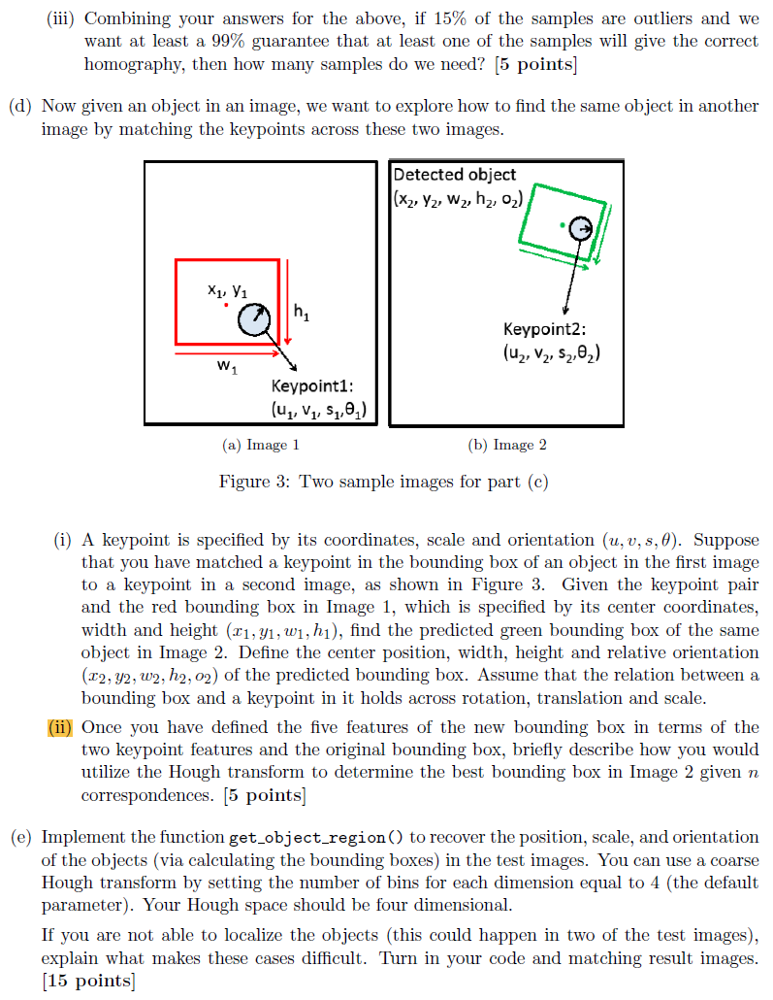

In [15]:
import random
from single_object_recognition.utils import *
import math
from collections import defaultdict

In [16]:
data = sio.loadmat('./single_object_recognition/SIFT_data.mat')
images = data['stopim'][0]
obj_bbox = data['obj_bbox'][0]
keypoints = data['keypt'][0]
descriptors = data['sift_desc'][0]

np.random.seed(0)

In [17]:
obj_bbox

array([ 76,  26, 287, 236], dtype=uint16)

In [18]:
def match_keypoints(descriptors1, descriptors2, threshold = 0.7):
    '''
    MATCH_KEYPOINTS: Given two sets of descriptors corresponding to SIFT keypoints, 
    find pairs of matching keypoints.
    Note: Read Lowe's Keypoint matching, finding the closest keypoint is not
    sufficient to find a match. thresh is the threshold for a valid match.
    Arguments:
    descriptors1 - Descriptors corresponding to the first image. Each row
        corresponds to a descriptor. This is a ndarray of size (M_1, 128).
    descriptors2 - Descriptors corresponding to the second image. Each row
        corresponds to a descriptor. This is a ndarray of size (M_2, 128).
    threshold - The threshold which to accept from Lowe's Keypoint Matching
        algorithm
    Returns:
    matches - An int ndarray of size (N, 2) of indices that for keypoints in 
        descriptors1 match which keypoints in descriptors2. For example, [7 5]
        would mean that the keypoint at index 7 of descriptors1 matches the
        keypoint at index 5 of descriptors2. Not every keypoint will necessarily
        have a match, so N is not the same as the number of rows in descriptors1
        or descriptors2. 
    '''
    # TODO: Implement this method!
    matches = []
    M1, M2 = descriptors1.shape[0], descriptors2.shape[0]
    for i in range(M1):
        d1 = np.repeat(descriptors1[i:i+1, :], M2, axis=0)
        dist = np.sqrt(np.sum((d1 - descriptors2) ** 2, axis=1))
        if np.min(dist) / (np.partition(dist, 2)[1]) <= threshold:
            matches.append([i, np.argmin(dist)])
    matches = np.array(matches).reshape(-1, 2)
    return matches

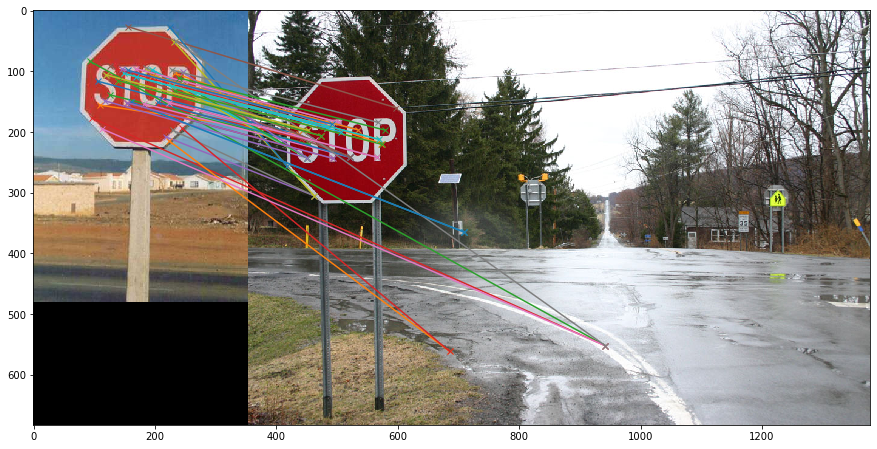

In [19]:
# Part A
descriptors1, keypoints1, = select_keypoints_in_bbox(descriptors[0], keypoints[0], obj_bbox)
matches = match_keypoints(descriptors1, descriptors[2])
plot_matches(images[0], images[2], keypoints1, keypoints[2], matches)

In [20]:
matches.shape

(53, 2)

In [21]:
def refine_match(keypoints1, keypoints2, matches, reprojection_threshold = 10,
        num_iterations = 1000):
    '''
    REFINE_MATCH: Filter out spurious matches between two images by using RANSAC
    to find a projection matrix. 
    Arguments:
        keypoints1 - Keypoints in the first image. Each row is a SIFT keypoint
            consisting of (u, v, scale, theta). Overall, this variable is a ndarray
            of size (M_1, 4).
        keypoints2 - Keypoints in the second image. Each row is a SIFT keypoint
            consisting of (u, v, scale, theta). Overall, this variable is a ndarray
            of size (M_2, 4).
        matches - An int ndarray of size (N, 2) of indices that indicate what
            keypoints from the first image (keypoints1)  match with the second 
            image (keypoints2). For example, [7 5] would mean that the keypoint at
            index 7 of keypoints1 matches the keypoint at index 5 of keypoints2). 
            Not every keypoint will necessarily have a  match, so N is not the same
            as the number of rows in keypoints1 or keypoints2. 
        reprojection_threshold - If the reprojection error is below this threshold,
            then we will count it as an inlier during the RANSAC process.
        num_iterations - The number of iterations we will run RANSAC for.
    Returns:
        inliers - A vector of integer indices that correspond to the inliers of the
            final model found by RANSAC.
        model - The projection matrix H found by RANSAC that has the most number of
            inliers.
    '''
    # TODO: Implement this method!
    N = matches.shape[0]
    n_samples = 7
    one = np.ones(N)
    # Form the homogeneous coordinate
    matched1 = np.c_[keypoints1[matches[:, 0], :2], one] # (N, 3)
    matched2 = np.c_[keypoints2[matches[:, 1], :2], one] # (N, 3)
    n_inliers = 0
    for i in range(num_iterations):
        temp_max = np.zeros(N, dtype=np.int32)
        temp_n = 0
        # random choose subset of n_samples
        idx = np.random.choice(N, n_samples, replace=False)
        p1T, p2T = matched1[idx], matched2[idx] # (n_samples, 3) actually p1^T and p2^2 here
        # H * p1 = p2, ==> p1^T * H^T = p2^T, use lstsq to solve
        H = np.linalg.lstsq(p1T, p2T, rcond=None)[0].T
        x_p = H.dot(matched1.T).T
        x_p /= x_p[:, 2:3]
        x_p = x_p[:, :2]
        temp_max = np.linalg.norm(x_p - matched2[:, :2], axis=1) ** 2 < reprojection_threshold
        temp_n = np.sum(temp_max)
        if temp_n > n_inliers:
            n_inliers = temp_n
            inliers = temp_max.copy()
    H = np.linalg.lstsq(matched1[inliers], matched1[inliers], rcond=None)[0].T
    model = H
    return inliers, model

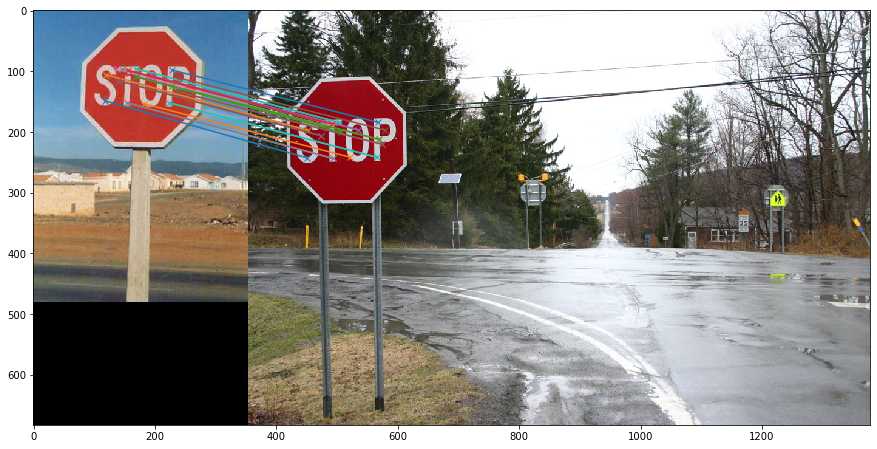

In [22]:
# Part B
inliers, model = refine_match(keypoints1, keypoints[2], matches)
plot_matches(images[0], images[2], keypoints1, keypoints[2], matches[inliers,:])

In [23]:
def get_object_region(keypoints1, keypoints2, matches, obj_bbox, thresh = 2, 
        nbins = 4):
    '''
    GET_OBJECT_REGION: Get the parameters for each of the predicted object
    bounding box in the image
    Arguments:
        keypoints1 - Keypoints in the first image. Each row is a SIFT keypoint
            consisting of (u, v, scale, theta). Overall, this variable is a ndarray
            of size (M_1, 4).
        keypoints2 - Keypoints in the second image. Each row is a SIFT keypoint
            consisting of (u, v, scale, theta). Overall, this variable is a ndarray
            of size (M_2, 4).
        matches - An int ndarray of size (N, 2) of indices that indicate what
            keypoints from the first image (keypoints1)  match with the second 
            image (keypoints2). For example, [7 5] would mean that the keypoint at
            index 7 of keypoints1 matches the keypoint at index 5 of keypoints2). 
            Not every keypoint will necessarily have a  match, so N is not the same
            as the number of rows in keypoints1 or keypoints2.
        obj_bbox - An ndarray of size (4,) that contains [xmin, ymin, xmax, ymax]
            of the bounding box. Note that the point (xmin, ymin) is one corner of
            the box and (xmax, ymax) is the opposite corner of the box.
        thresh - The threshold we use in Hough voting to state that we have found
            a valid object region.
    Returns:
        cx - A list of the x location of the center of the bounding boxes
        cy - A list of the y location of the center of the bounding boxes
        w - A list of the width of the bounding boxes
        h - A list of the height of the bounding boxes
        orient - A list f the orientation of the bounding box. Note that the 
            theta provided by the SIFT keypoint is inverted. You will need to
            re-invert it.
    '''
    # TODO: Implement this method!
    # from https://github.com/mikucy/CS231A/blob/master/ps3_code/single_object_recognition/main.py
    cx, cy, w, h, orient = [], [], [], [], []

    for match in matches:
        # find keypoint1 & keypoint2
        key_index1 = match[0]
        key_index2 = match[1]
        key_point1 = keypoints1[key_index1]
        key_point2 = keypoints2[key_index2]
        # keypoint 1 vars
        u1 = key_point1[0]
        v1 = key_point1[1]
        s1 = key_point1[2]
        theta1 = key_point1[3]
        # keypoint 2 vars
        u2 = key_point2[0]
        v2 = key_point2[1]
        s2 = key_point2[2]
        theta2 = key_point2[3]

        # find center, width and height of bounding box in img1
        xmin, ymin, xmax, ymax = obj_bbox
        xc1 = (xmin + xmax) / 2
        yc1 = (ymin + ymax) / 2
        w1 = (xmax - xmin)
        h1 = (ymax - ymin)
        # find bounding box in img2
        o2 = theta2 - theta1
        xc2 = (s2/s1)*np.cos(o2)*(xc1-u1) - (s2/s1)*np.sin(o2)*(yc1-v1) + u2
        yc2 = (s2/s1)*np.sin(o2)*(xc1-u1) + (s2/s1)*np.cos(o2)*(yc1-v1) + v2
        w2 = (s2/s1) * w1
        h2 = (s2/s1) * h1
        # add to list
        cx.append(xc2)
        cy.append(yc2)
        w.append(w2)
        h.append(h2)
        orient.append(o2)

    # find min and max of vars
    cx_min = min(cx)
    cx_max = max(cx)
    cy_min = min(cy)
    cy_max = max(cy)
    w_min = min(w)
    w_max = max(w)
    h_min = min(h)
    h_max = max(h)
    orient_min = min(orient)
    orient_max = max(orient)
    # bin sizes
    cx_bin_size = (cx_max - cx_min) / float(nbins)
    cy_bin_size = (cy_max - cy_min) / float(nbins)
    w_bin_size = (w_max - w_min) / float(nbins)
    h_bin_size = (h_max - h_min) / float(nbins)
    orient_bin_size = (orient_max - orient_min) / float(nbins)

    # add elements into bins
    bins = defaultdict(list)
    for n in range(matches.shape[0]):
        cx_point = cx[n]
        cy_point = cy[n]
        w_point = w[n]
        orient_point = orient[n]

        for i in range(nbins):
            for j in range(nbins):
                for k in range(nbins):
                    for l in range(nbins):
                        if (cx_min+i*cx_bin_size <= cx_point
                                <= cx_min+(i+1)*cx_bin_size):
                            if (cy_min+j*cy_bin_size <= cy_point
                                    <= cy_min+(j+1)*cy_bin_size):
                                if (w_min+k*w_bin_size <= w_point
                                        <= w_min+(k+1)*w_bin_size):
                                    if (orient_min+l*orient_bin_size
                                            <= orient_point
                                            <= orient_min+(l+1)*orient_bin_size):
                                        bins[(i,j,k,l)].append(n)

    # parameters to return
    cx0, cy0, w0, h0, orient0 = [], [], [], [], []
    for bin_index in bins:
        indices = bins[bin_index]
        votes = len(indices)

        if votes >= thresh:
            cx0.append(np.sum(np.array(cx)[indices]) / votes)
            cy0.append(np.sum(np.array(cy)[indices]) / votes)
            w0.append(np.sum(np.array(w)[indices]) / votes)
            h0.append(np.sum(np.array(h)[indices]) / votes)
            orient0.append(np.sum(np.array(orient)[indices]) / votes)
    return cx0, cy0, w0, h0, orient0

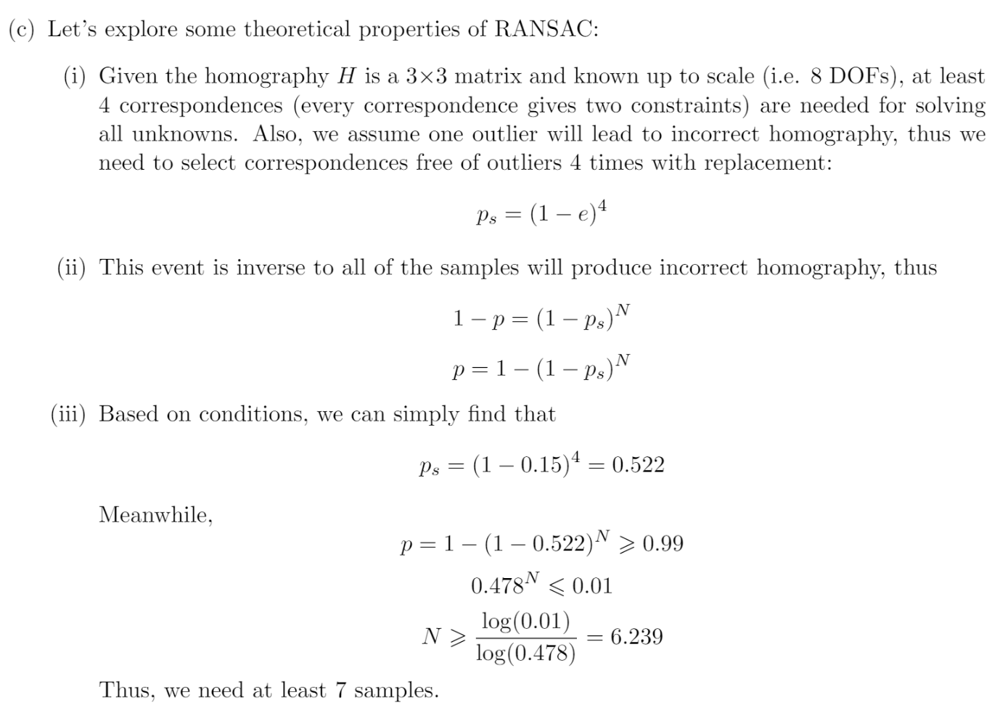
from https://github.com/chizhang529/cs231a/blob/master/Homework/PS3/Problem%20Set%203%20Solution.pdf

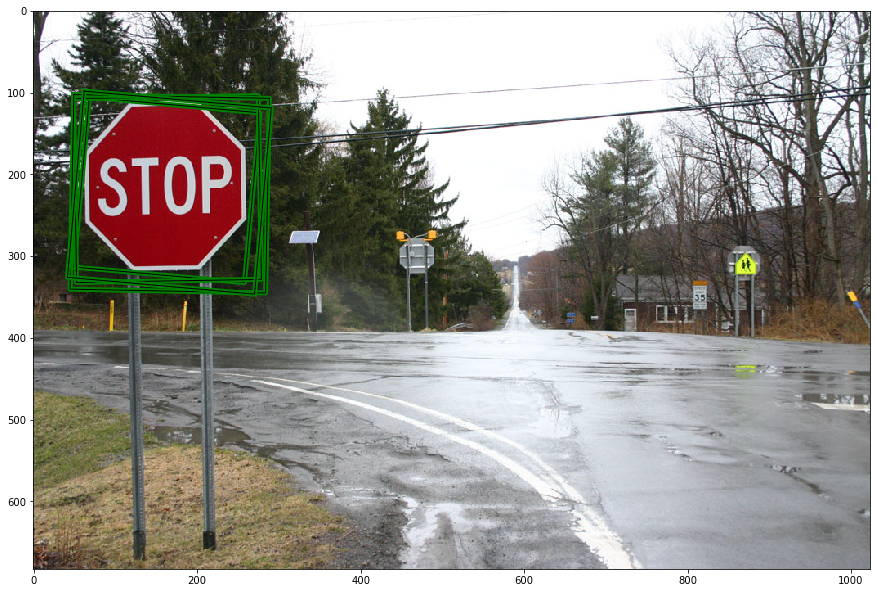

In [24]:
# Part C
cx, cy, w, h, orient = get_object_region(keypoints1, keypoints[2],
    matches[inliers,:], obj_bbox)

plot_bbox(cx, cy, w, h, orient, images[2])

In [25]:
def match_object(im1, descriptors1, keypoints1, im2, descriptors2, keypoints2,
        obj_bbox):
    '''
    MATCH_OBJECT: The pipeline for matching an object in one image with another
    Arguments:
        im1 - The first image read in as a ndarray of size (H, W, C).
        descriptors1 - Descriptors corresponding to the first image. Each row
            corresponds to a descriptor. This is a ndarray of size (M_1, 128).
        keypoints1 - Keypoints in the first image. Each row is a SIFT keypoint
            consisting of (u, v, scale, theta). Overall, this variable is a ndarray
            of size (M_1, 4).
        im2 - The second image read in as a ndarray of size (H, W, C).
        descriptors2 - Descriptors corresponding to the second image. Each row
            corresponds to a descriptor. This is a ndarray of size (M_2, 128).
        keypoints2 - Keypoints in the second image. Each row is a SIFT keypoint
            consisting of (u, v, scale, theta). Overall, this variable is a ndarray
            of size (M_2, 4).
        obj_bbox - An ndarray of size (4,) that contains [xmin, ymin, xmax, ymax]
            of the bounding box. Note that the point (xmin, ymin) is one corner of
            the box and (xmax, ymax) is the opposite corner of the box.
    Returns:
        descriptors - The descriptors corresponding to the keypoints inside the
            bounding box.
        keypoints - The pixel locations of the keypoints that reside in the 
            bounding box
    '''
    # Part A
    descriptors1, keypoints1, = select_keypoints_in_bbox(descriptors1,
        keypoints1, obj_bbox)
    matches = match_keypoints(descriptors1, descriptors2)
    plot_matches(im1, im2, keypoints1, keypoints2, matches)
    
    # Part B
    inliers, model = refine_match(keypoints1, keypoints2, matches)
    plot_matches(im1, im2, keypoints1, keypoints2, matches[inliers,:])

    # Part C
    cx, cy, w, h, orient = get_object_region(keypoints1, keypoints2,
        matches[inliers,:], obj_bbox)

    plot_bbox(cx, cy, w, h, orient, im2)

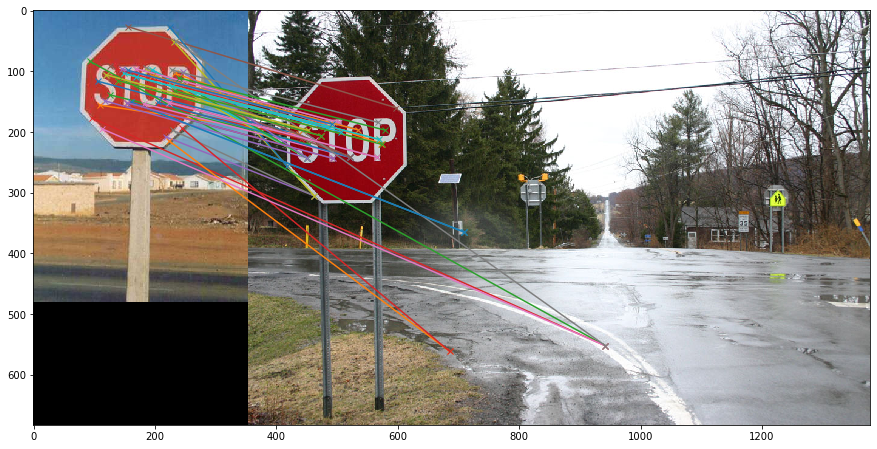

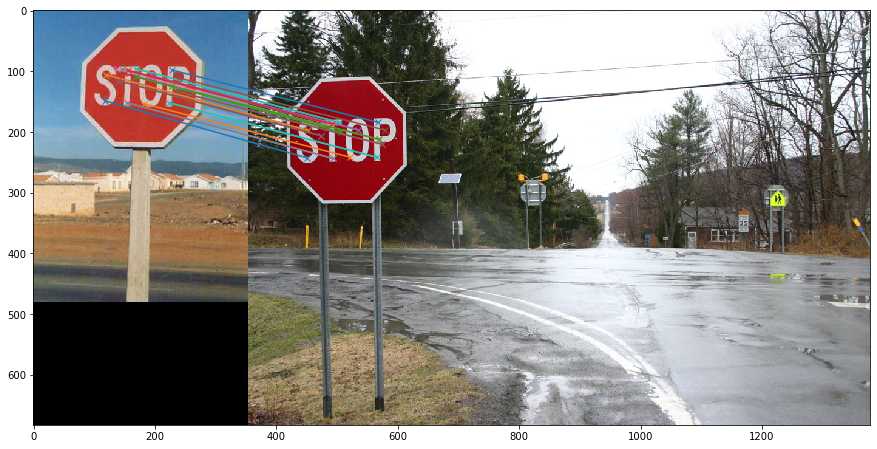

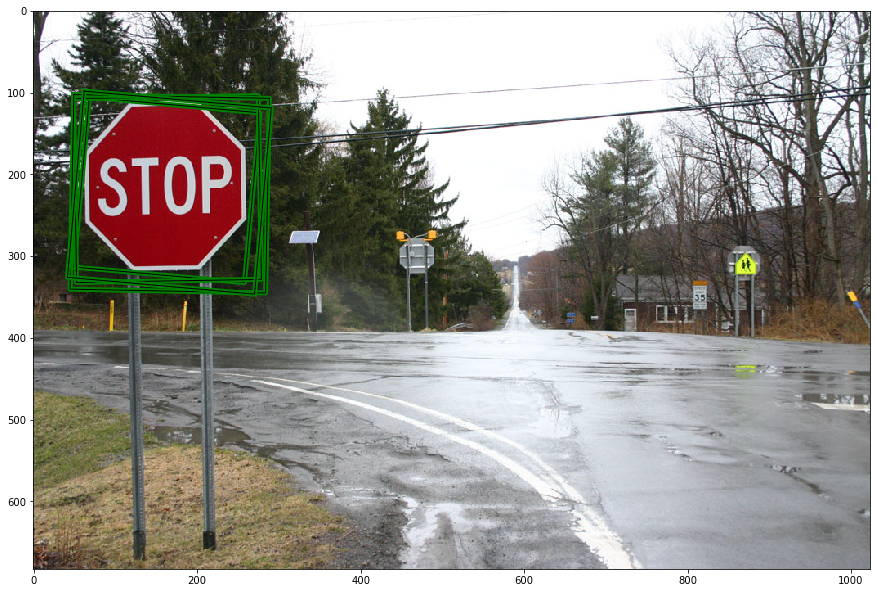

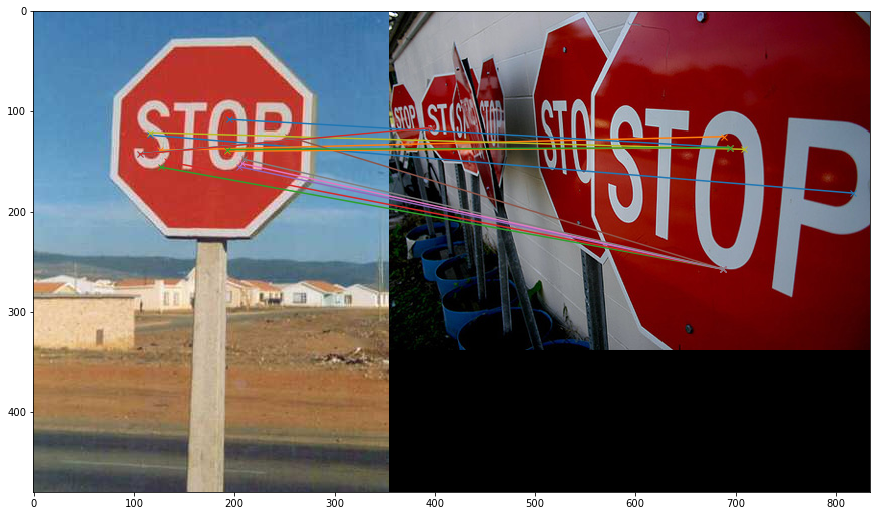

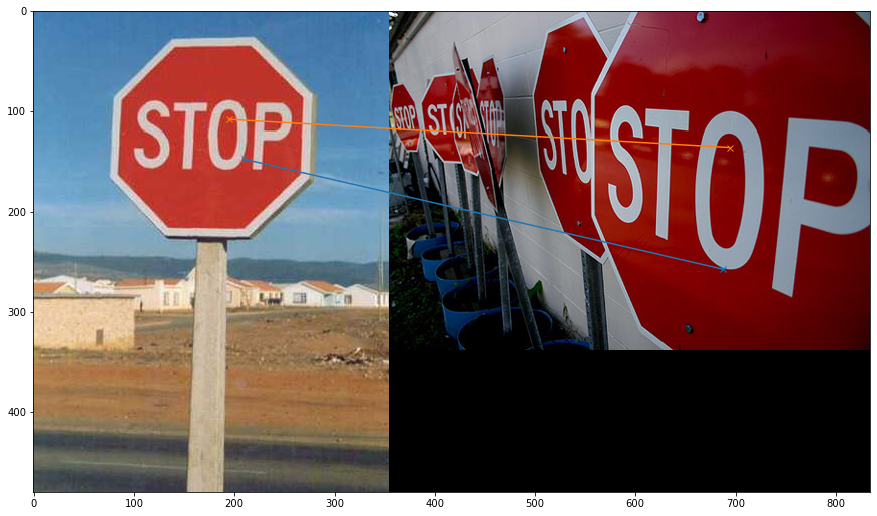

...

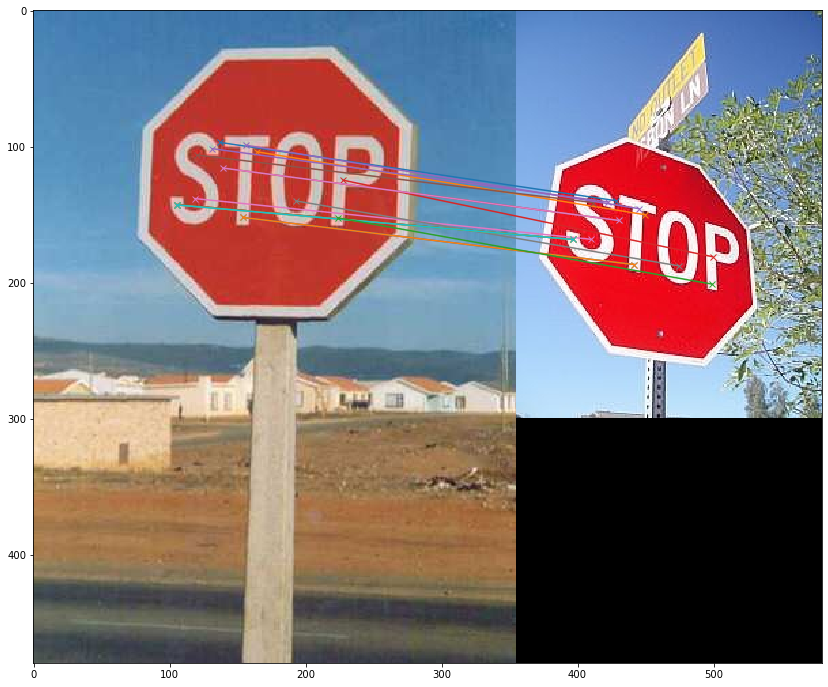

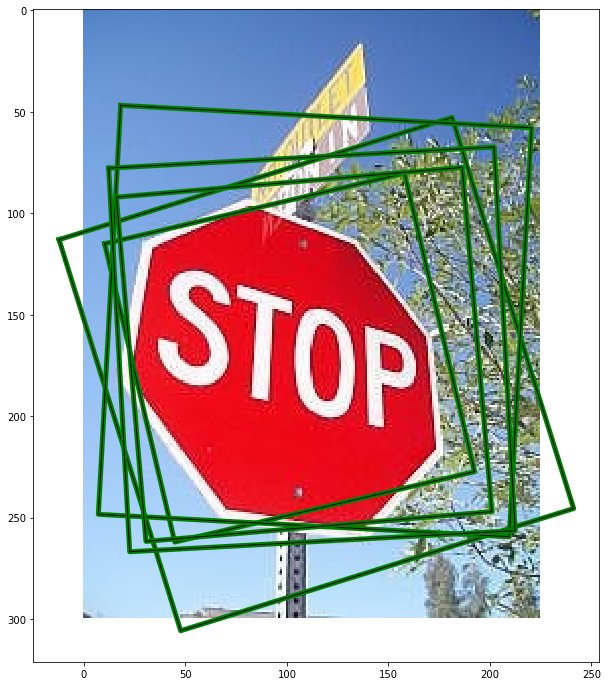

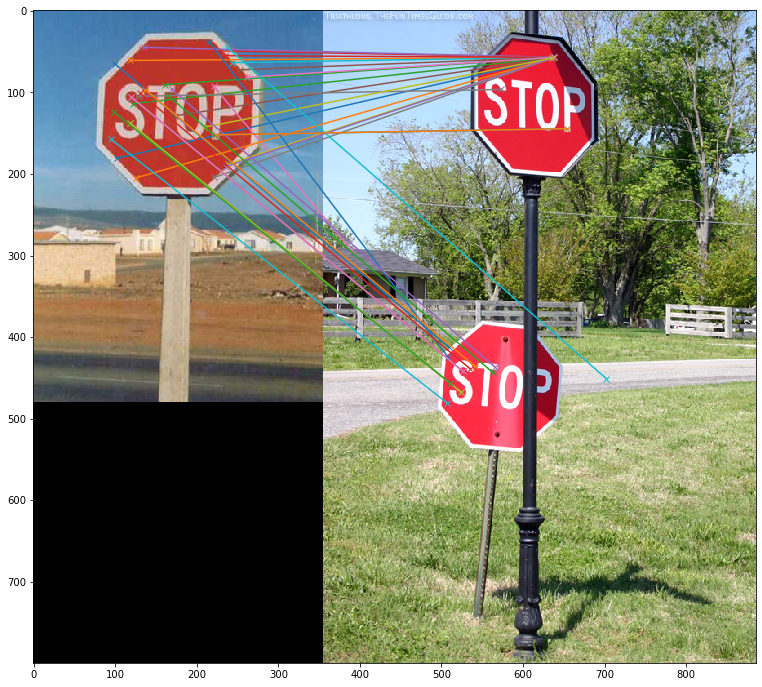

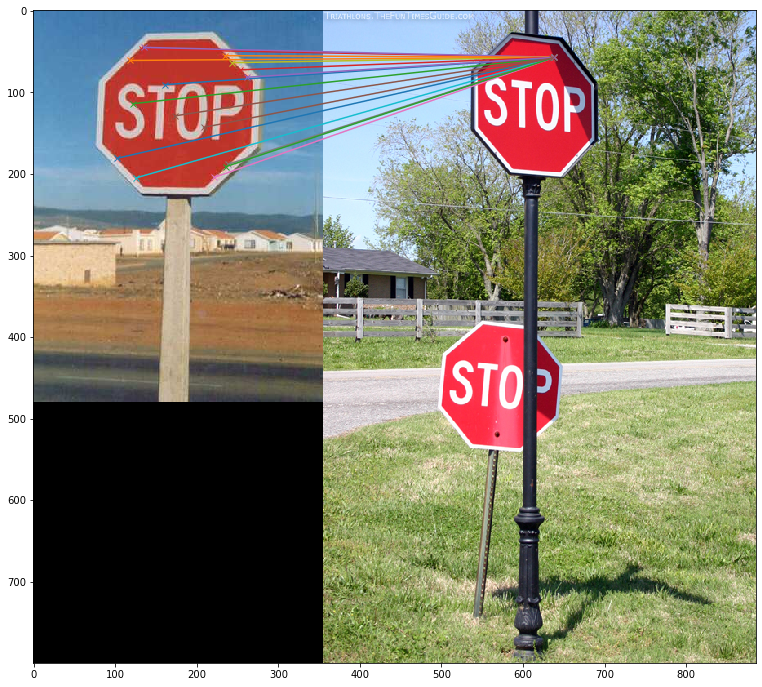

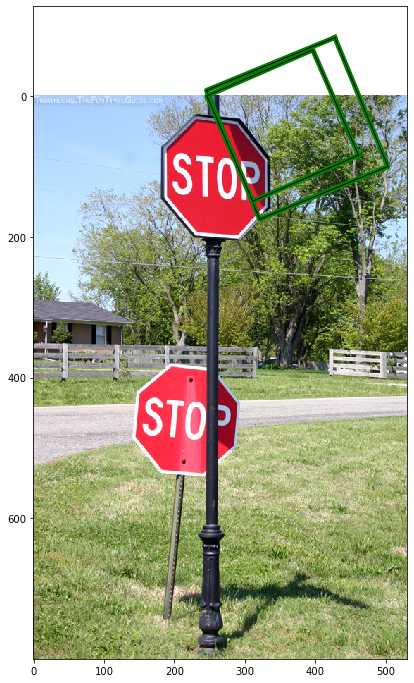

In [26]:
# Load the data
data = sio.loadmat('./single_object_recognition/SIFT_data.mat')
images = data['stopim'][0]
obj_bbox = data['obj_bbox'][0]
keypoints = data['keypt'][0]
descriptors = data['sift_desc'][0]

np.random.seed(0)

for i in [2, 1, 3, 4]:
    match_object(images[0], descriptors[0], keypoints[0], images[i],
        descriptors[i], keypoints[i], obj_bbox)

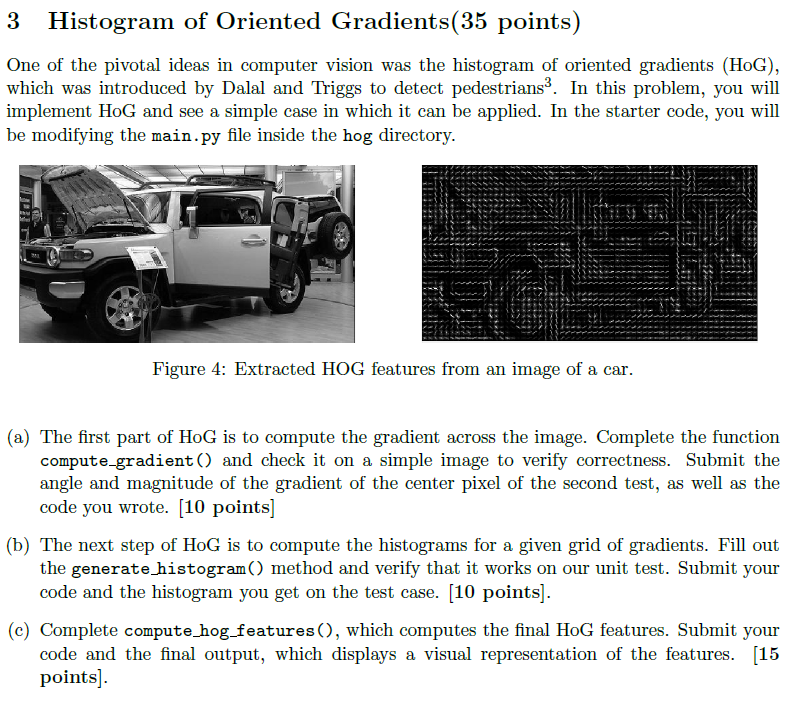

In [27]:
import numpy as np
import skimage.io as sio
from scipy.io import loadmat
import math
from scipy.ndimage.interpolation import rotate
from skimage.transform import resize

In [28]:
def compute_gradient(im):
    '''
    COMPUTE_GRADIENT Given an image, computes the pixel gradients

    Arguments:
        im - a grayscale image, represented as an ndarray of size (H, W) containing
            the pixel values

    Returns:
        angles - ndarray of size (H-2, W-2) containing gradient angles in degrees

        magnitudes - ndarray of size (H-2, W-2) containing gradient magnitudes

    The way that the angles and magnitude per pixel are computed as follows:
    Given the following pixel grid

        P1 P2 P3
        P4 P5 P6
        P7 P8 P9

    We compute the angle on P5 as arctan(dy/dx) = arctan(P2-P8 / P4-P6).
    Note that we should be using np.arctan2, which is more numerically stable.
    However, this puts us in the range [-180, 180] degrees. To be in the range
    [0,180], we need to simply add 180 degrees to the negative angles.

    The magnitude is simply sqrt((P4-P6)^2 + (P2-P8)^2)
    '''
    # TODO: Implement this method!
    H, W = im.shape
    angles = np.zeros((H-2, W-2))
    magnitudes = np.zeros((H-2, W-2))

    for i in range(1, H-1):
        for j in range(1, W-1):
            P2 = im[i-1, j]
            P8 = im[i+1, j]
            P4 = im[i, j-1]
            P6 = im[i, j+1]
            angle = np.arctan2(P2-P8, P4-P6) * (180/math.pi)
            magnitude = np.sqrt((P4-P6)**2 + (P2-P8)**2)

            if angle < 0:
                angle += 180
            angles[i-1, j-1] = angle
            magnitudes[i-1, j-1] = magnitude

    return angles, magnitudes

In [29]:
# Part A: Checking the image gradient
print('-' * 80)
print('Part A: Image gradient')
print('-' * 80)
im = sio.imread('./hog/simple.jpg', True)
grad_angle, grad_magnitude = compute_gradient(im)
print("Expected angle: 126.339396329")
print("Expected magnitude: 0.423547566786")
print("Checking gradient test case 1:", \
    np.abs(grad_angle[0][0] - 126.339396329) < 1e-3 and \
    np.abs(grad_magnitude[0][0] - 0.423547566786) < 1e-3)

im = np.array([[1, 2, 2, 4, 8],
                [3, 0, 1, 5, 10],
                [10, 13, 12, 2, 7],
                [10, 5, 1, 0, 3],
                [1, 1, 1.5, 2, 2.5]])
grad_angle, grad_magnitude = compute_gradient(im)
correct_angle = np.array([[ 100.30484647,   63.43494882,  167.47119229],
                          [  68.19859051,    0.        ,   45.        ],
                          [  53.13010235,   64.53665494,  180.        ]])
correct_magnitude = np.array([[ 11.18033989,  11.18033989,   9.21954446],
                              [  5.38516481,  11.        ,   7.07106781],
                              [ 15.        ,  11.62970335,   2.        ]])
print("Expected angles: \n", correct_angle)
print("Expected magnitudes: \n", correct_magnitude)
print("Checking gradient test case 2:", \
    np.allclose(grad_angle, correct_angle) and \
    np.allclose(grad_magnitude, correct_magnitude))

--------------------------------------------------------------------------------
Part A: Image gradient
--------------------------------------------------------------------------------
Expected angle: 126.339396329
Expected magnitude: 0.423547566786
Checking gradient test case 1: True
Expected angles: 
 [[100.30484647  63.43494882 167.47119229]
 [ 68.19859051   0.          45.        ]
 [ 53.13010235  64.53665494 180.        ]]
Expected magnitudes: 
 [[11.18033989 11.18033989  9.21954446]
 [ 5.38516481 11.          7.07106781]
 [15.         11.62970335  2.        ]]
Checking gradient test case 2: True


In [30]:
def generate_histogram(angles, magnitudes, nbins = 9):
    '''
    GENERATE_HISTOGRAM Given matrices of angles and magnitudes of the image
    gradient, generate the histogram of angles

    Arguments:
        angles - ndarray of size (M, N) containing gradient angles in degrees

        magnitudes - ndarray of size (M, N) containing gradient magnitudes

        nbins - the number of bins that you want to bin the histogram into

    Returns:
        histogram - an ndarray of size (nbins,) containing the distribution
            of gradient angles.

    This method should be implemented as follows:

    1)Each histogram will bin the angle from 0 to 180 degrees. The number of bins
    will dictate what angles fall into what bin (i.e. if nbins=9, then first bin
    will contain the votes of angles close to 10, the second bin will contain those
    close to 30, etc).

    2) To create these histogram, iterate over the gradient grids, putting each
    gradient into its respective bins. To do this properly, we interpolate and
    weight the voting by both its magnitude and how close it is to the average
    angle of the two bins closest to the angle of the gradient. For example, if we
    have nbins = 9 and receive angle of 20 degrees with magnitude 1, then we the
    vote contribution to the histogram weights equally with the first and second bins
    (since its closest to both 10 and 30 degrees). If instead, we recieve angle of
    25 degrees with magnitude 2, then it is weighted 25% in the first bin and 75%
    in second bin, but with twice the voting power.

    Mathematically, if you have an angle, magnitude, the center_angle1 of the lower
    bin center_angle2 of the higher bin, then:

    histogram[bin1] += magnitude * |angle - center_angle2| / (180 / nbins) 
    histogram[bin2] += magnitude * |angle - center_angle1| / (180 / nbins)

    Notice how that we're weighting by the distance to the opposite center. The
    further the angle is from one center means it is closer to the opposite center
    (and should be weighted more).

    One special case you will have to take care of is when the angle is near
    180 degrees or 0 degrees. It may be that the two nearest bins are the first and
    last bins respectively.
    '''
    # TODO: Implement this method!
    histogram = np.zeros(nbins)
    bin_interval = 180 / nbins
    center_angles = np.zeros_like(histogram)
    for i in range(nbins):
        center_angles[i] = (0.5+i) * bin_interval

    M, N = angles.shape
    for m in range(M):
        for n in range(N):
            angle = angles[m, n]
            mag = magnitudes[m, n]
            
            bin_diff = np.abs(center_angles - angle)
            
            minIdx = np.argmin(bin_diff)
            # when the angle is near 0 degrees
            if minIdx == 0:
                bin_diff[-1] = 180 - center_angles[-1] + angle
            # when the angle is near 180 degrees
            if minIdx == nbins - 1:
                bin_diff[0] = 180 - angle + center_angles[0]
            # find two closet bins
            bin1, bin2 = np.argsort(bin_diff)[0:2]
            histogram[bin1] += mag * bin_diff[bin2] / (180.0/nbins)
            histogram[bin2] += mag * bin_diff[bin1] / (180.0/nbins)

    return histogram

In [31]:
# Part B: Checking the histogram generation
print('-' * 80)
print('Part B: Histogram generation')
print('-' * 80)
angles = np.array([[10, 30, 50], [70, 90, 110], [130, 150, 170]])
magnitudes = np.arange(1,10).reshape((3,3))
print("Checking histogram test case 1:", \
    np.all(generate_histogram(angles, magnitudes, nbins = 9) == np.arange(1,10)))
angles = np.array([[20, 40, 60], [80, 100, 120], [140, 160, 180]])
magnitudes = np.arange(1,19,2).reshape((3,3))
histogram = generate_histogram(angles, magnitudes, nbins = 9)
print("Checking histogram test case 2:", \
    np.all(histogram  == np.array([9, 2, 4, 6, 8, 10, 12, 14, 16])))
angles = np.array([[13, 23, 14.3], [53, 108, 1], [77, 8, 32]])
magnitudes = np.ones((3,3)) 
histogram = generate_histogram(angles, magnitudes, nbins = 9)
print("Submit these results:", histogram)

--------------------------------------------------------------------------------
Part B: Histogram generation
--------------------------------------------------------------------------------
Checking histogram test case 1: True
Checking histogram test case 2: True
Submit these results: [3.435 1.915 0.95  0.8   0.45  0.9   0.    0.    0.55 ]


In [32]:
def compute_hog_features(im, pixels_in_cell, cells_in_block, nbins):
    '''
    COMPUTE_HOG_FEATURES Computes the histogram of gradients features
    Arguments:
        im - the image matrix

        pixels_in_cell - each cell will be of size (pixels_in_cell, pixels_in_cell)
            pixels

        cells_in_block - each block will be of size (cells_in_block, cells_in_block)
            cells

        nbins - number of histogram bins

    Returns:
        features - the hog features of the image represented as an ndarray of size
            (H_blocks, W_blocks, cells_in_block * cells_in_block * nbins), where
                H_blocks is the number of blocks that fit height-wise
                W_blocks is the number of blocks that fit width-wise

    Generating the HoG features can be done as follows:

    1) Compute the gradient for the image, generating angles and magnitudes

    2) Define a cell, which is a grid of (pixels_in_cell, pixels_in_cell) pixels.
    Also, define a block, which is a grid of (cells_in_block, cells_in_block) cells.
    This means each block is a grid of side length pixels_in_cell * cell_in_block
    pixels.

    3) Pass a sliding window over the image, with the window size being the size of
    a block. The stride of the sliding window should be half the block size, (50%
    overlap). Each cell in each block will store a histogram of the gradients in
    that cell. Consequently, there will be cells_in_block * cells_in_block
    histograms in each block. This means that each block feature will initially
    represented as a (cells_in_block, cells_in_block, nbins) ndarray, that can
    reshaped into a (cells_in_block * cells_in_block *nbins,) ndarray. Make sure to
    normalize such that the norm of this flattened block feature is 1. 

    4) The overall hog feature that you return will be a grid of all these flattened
    block features.

    Note: The final overall feature ndarray can be flattened if you want to use to
    train a classifier or use it as a feature vector.
    '''
    # TODO: Implement this method!
    # compute gradients for the image
    angles, magnitudes = compute_gradient(im)

    # define cells and blocks
    cell_size = pixels_in_cell
    block_size = pixels_in_cell * cells_in_block
    # compute H_blocks, W_blocks, here block serves as filters in CNN
    H, W = angles.shape
    stride = int(block_size / 2)
    H_blocks = int((H - block_size) / stride) + 1
    W_blocks = int((W - block_size) / stride) + 1
    # construct hog feature
    hog_feature = np.zeros((H_blocks, W_blocks, cells_in_block * cells_in_block * nbins))
    for h in range(H_blocks):
        for w in range(W_blocks):
            
            block_angles = angles[h*stride : h*stride+block_size,
                           w*stride : w*stride+block_size]
            block_magnitudes = magnitudes[h*stride : h*stride+block_size,
                               w*stride : w*stride+block_size]
            # find histogram of a single block, loop over all cells in this block
            block_hog_feature = np.zeros((cells_in_block, cells_in_block, nbins))
            for i in range(cells_in_block):
                for j in range(cells_in_block):
                    cell_angles = block_angles[i*pixels_in_cell : (i+1)*pixels_in_cell,
                                  j*pixels_in_cell : (j+1)*pixels_in_cell]
                    cell_magnitudes = block_magnitudes[i*pixels_in_cell : (i+1)*pixels_in_cell,
                                  j*pixels_in_cell : (j+1)*pixels_in_cell]
                    cell_hist = generate_histogram(cell_angles, cell_magnitudes, nbins)
                    block_hog_feature[i, j, :] = cell_hist

            # flattened to a vector
            block_hog_feature = block_hog_feature.reshape(-1)
            # normalize
            block_hog_feature /= np.linalg.norm(block_hog_feature)
            hog_feature[h, w, :] = block_hog_feature

    return hog_feature

In [33]:
# Make picture of positive HOG weights.
def hog_picture(w, bs = 20):
    # construct a "glyph" for each orientaion
    bim1 = np.zeros((bs, bs))
    bim1[:,int(round(bs/2.0))-1:int(round(bs/2.0))+1] = 1
    bim = np.zeros((bs, bs, 9))
    bim[:,:,0] = bim1
    for i in range(1,9):
        bim[:,:,i] = resize(rotate(bim1, -i * float(bs), reshape=False),(bs, bs))

    # make pictures of positive weights bs adding up weighted glyphs
    w[w < 0] = 0.0
    im = np.zeros((bs * w.shape[0], bs * w.shape[1]))
    for i in range(w.shape[0]):
        for j in range(w.shape[1]):
            for k in range(9):
                im[i * bs : (i+1) * bs, j * bs : (j+1) * bs] += bim[:,:,k] * w[i,j,k+18]

    scale = max(w.max(), -w.max()) + 1e-8
    im /= scale
    return im

In [34]:
# Displays the HoG features next to the original image
def show_hog(orig, w, figsize = (8,16)):
    w = np.tile(w, [1, 1, 3])
    w = np.pad(w, ((0,0), (0,0), (0,5)), 'constant', constant_values=0)

    #  # Make pictures of positive and negative weights
    pos = hog_picture(w)
    neg = hog_picture(-w)

    # Put pictures together and draw
    buff = 10
    if w.min() < 0.0:
        pos = np.pad(pos, (buff, buff), 'constant', constant_values=0.5)
        neg = np.pad(neg, (buff, buff), 'constant', constant_values=0.5)
        im = np.hstack([pos, neg])
    else:
        im = pos

    im[im < 0] = 0.0
    im[im > 1] = 1.0
    plt.figure(figsize = figsize)
    plt.subplot(211)
    plt.imshow(orig, cmap='gray')
    plt.xticks([])
    plt.yticks([])
    plt.subplot(212)
    plt.imshow(im, cmap='gray')
    plt.xticks([])
    plt.yticks([])
    plt.show()


In [35]:
# Part C: Computing and displaying the final HoG features
# vary cell size to change the output feature vector. These parameters are common parameters

pixels_in_cell = 8
cells_in_block = 2
nbins = 9
im = sio.imread('./hog/car.jpg', True)
car_hog_feat = compute_hog_features(im, pixels_in_cell, cells_in_block, nbins)

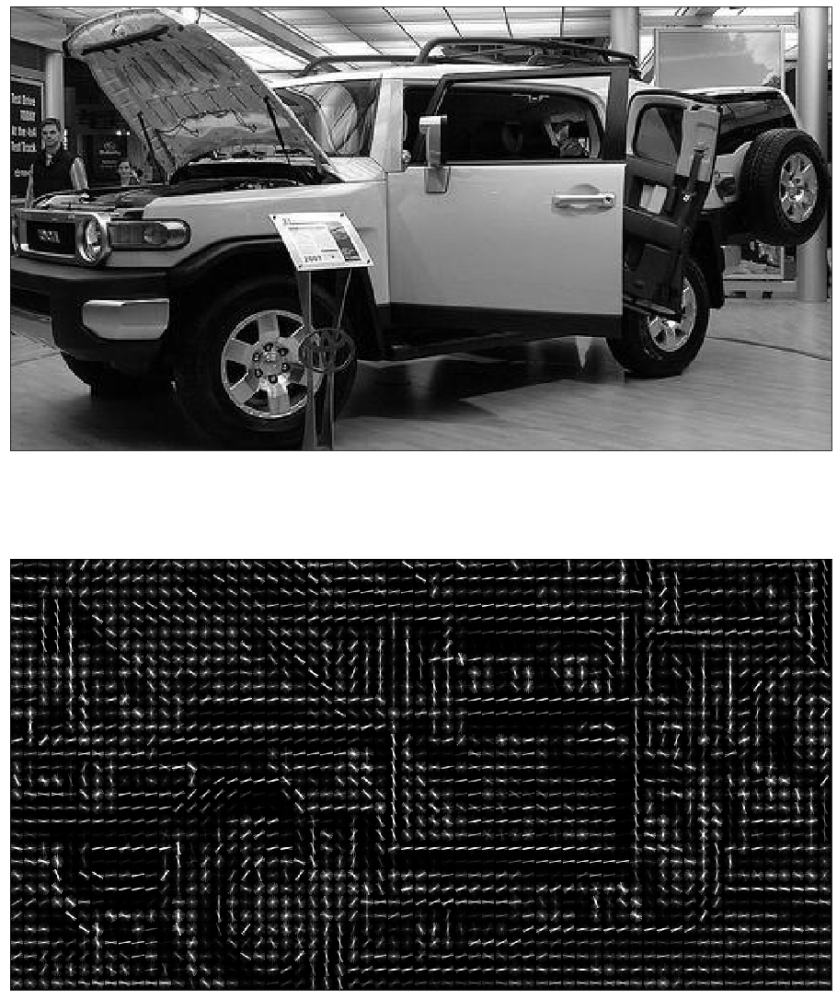

In [36]:
show_hog(im, car_hog_feat, figsize = (16,20))